## Explainability of ML price prediction in Viennas short-term rental market using SHAP

### 1. Project Background

In 2022, Airbnb reported an increase in bookings with over 393 million booked nights and experiences. This growth highlights the increasing demand and popularity of the Airbnb platform [1].

Numerous factors contribute to the pricing of Airbnb listings - understanding these elements is crucial for both, hosts and guests [4]. Research has shown that factors such as ratings, facilities, and proximity to landmarks have a positive effect on a listing's price. As these aspects indicate the value and desirability of a property, they also influence its pricing strategy [2].

However, Airbnb pricing is determined by much more than solely these factors: It is also subject to seasonal variations, geographic aspects, and the heterogeneity of the host population [2][5][6]. These variables additionally introduce complexity into the pricing structure, making it challenging to determine the specific factors driving the price for a particular listing [3].

Consequently, there is still a lack of explainability in Airbnb's pricing system, leaving both, hosts and guests with limited insights into the pricing decision-making process [7][10].

To address this issue, our research aims at utilizing explainable artificial intelligence (xAI) techniques, more specifically SHAP (SHapley Additive exPlanations [11], to answer the following research questions:

1) How can xAI using SHAP be utilized to enhance transparency in the Airbnb rental pricing in Vienna

2) How interpretable is SHAP’s output in the context of predicting Airbnb rental pricing? 

As part of the first research question, we will establish various machine learning (ML) models to predict the price of listings. To enhance the explainability of these factors, we will incorporate SHAP, a state-of-the-art technique that provides insights into feature importance and their impact on predictions. Thereby, we will identify the key factors contributing to Airbnb's price determination [8][9].

Through this research, we aim at shedding light on the factors driving Airbnb rental prices, thereby improving transparency for both, hosts and guests. 

In addition,by answering the second research question, we will assess the interpretability of SHAP's output and explore its effectiveness in providing insights in the context of predicting Airbnb rental pricing.

Overall, we aim at a more comprehensive understanding of Airbnb pricing dynamics by combining ML models with SHAP's explainability capabilities.


### 2. Prerequisites

As a first step, essential libraries for data analysis and visualization are imported. Also, the haversine library is incorporated for calculating distances. Subsequently, the Airbnb data is imported.

In [32]:
# Importing libraries

import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from haversine import haversine, Unit

import warnings
warnings.filterwarnings('ignore')

In [33]:
# Importing data

listings = pd.read_csv('./data/listings.csv.gz', compression='gzip', 
                                 header=0, sep=',', quotechar='"')



### 1. Data Description

The dataset was retrieved from http://insideairbnb.com/. The data used was scraped on 19.05.2023. It contains information on all Airbnb listings in Vienna which were posted on Airbnb on that particular date. 

Each row in the data set is an Airbnb listing available for rental in Vienna (observation), while each column describes a different characteristics of the corresponding listing (feature).

As part of the project, the following features are identified to be of high importance: 

- "accommodates": states the number of guests the rental can accommodate

- "bedrooms": states the number of bedrooms included in the rental

- "bathrooms": states the number of bathrooms included in the rental

- "price": states the price for the rental per night

- "number_of_reviews": states the number of reviews that previous guests have left


### 3. Data Pre-processing 

This chapter aims at ensuring that the data is streamlined, accurate and free from missing values. Therefore, unused columns are dropped, certain data types are converted and missing data is handled by either imputation or removal.

In [34]:
# Dropping unused columns
listings = listings.drop(['name', 'listing_url', 'scrape_id', 'last_scraped', 'source',
       'picture_url', 'host_id','host_url', 'host_name', 'host_since', #'host_location',
       'host_thumbnail_url', 'host_picture_url',
       'neighbourhood',
       'neighbourhood_group_cleansed',
       "host_verifications",             
       'property_type',
       'bathrooms',
       'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights',
       'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm',
       'calendar_updated',
       'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365','calendar_last_scraped',
       'number_of_reviews_ltm',
       'last_review',
       'number_of_reviews_l30d',
       'first_review', 'license',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms'
       ], axis=1)

In [35]:
print(listings.columns)

Index(['id', 'description', 'neighborhood_overview', 'host_location',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'latitude', 'longitude', 'room_type',
       'accommodates', 'bathrooms_text', 'bedrooms', 'beds', 'amenities',
       'price', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable',
       'calculated_host_listings_count', 'reviews_per_month'],
      dtype='object')


#### 3.1 Checking for missing values

Firstly, the missing values specifically for the review column is dropped, while for now, the rest of the columns is kept intact. Later in the analysis, further entries with empty values are selectively removed where appropriate.

In [36]:
nan_count = listings.isna().sum()
print(nan_count)

listings[["review_scores_rating", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value", "reviews_per_month"]].dropna(axis=1, inplace=True)

id                                   0
description                        256
neighborhood_overview             5828
host_location                     2781
host_about                        6225
host_response_time                3971
host_response_rate                3971
host_acceptance_rate              3105
host_is_superhost                    2
host_neighbourhood                5689
host_listings_count                  2
host_total_listings_count            2
host_has_profile_pic                 2
host_identity_verified               2
neighbourhood_cleansed               0
latitude                             0
longitude                            0
room_type                            0
accommodates                         0
bathrooms_text                       5
bedrooms                          1171
beds                               136
amenities                            0
price                                0
minimum_nights                       0
maximum_nights           

In [37]:
# Checking distribution and categorize them for description, neighbourhood_overview, host_about

listings["description"] = listings['description'].str.split().str.len()
listings.loc[listings['description'].between(0, 67, 'both'), 'description'] = 0
listings.loc[listings['description'].between(67, 120, 'right'), 'description'] = 1
listings.loc[listings['description'].between(120, 155, 'right'), 'description'] = 2
listings.loc[listings['description'].between(155, 250, 'right'), 'description'] = 3

listings["neighborhood_overview"] = listings['neighborhood_overview'].str.split().str.len()
listings.loc[listings['neighborhood_overview'].between(0, 27, 'both'), 'neighborhood_overview'] = 0
listings.loc[listings['neighborhood_overview'].between(27, 51, 'right'), 'neighborhood_overview'] = 1
listings.loc[listings['neighborhood_overview'].between(51, 87, 'right'), 'neighborhood_overview'] = 2
listings.loc[listings['neighborhood_overview'].between(87, 300, 'right'), 'neighborhood_overview'] = 3

#listings["host_location_isVienna"] = listings["host_location"].replace({'Vienna, Austria': 1}).fillna(0)
listings["host_location_isVienna"]  = listings["host_location"].apply(lambda x: 1 if x == 'Vienna, Austria' else 0)
listings.drop('host_location', axis=1, inplace=True)


listings["host_about"] = listings['host_about'].str.split().str.len()
listings.loc[listings['host_about'].between(0, 16, 'both'), 'host_about'] = 0
listings.loc[listings['host_about'].between(16, 38, 'right'), 'host_about'] = 1
listings.loc[listings['host_about'].between(38, 76, 'right'), 'host_about'] = 2
listings.loc[listings['host_about'].between(76, 900, 'right'), 'host_about'] = 3

listings["host_response_time"] = listings["host_response_time"].replace({"within an hour": 1, 'within a few hours': 2, 'within a day': 3, 'a few days or more': 4, np.NaN: 5})

listings["host_response_rate"] = listings["host_response_rate"].str.rstrip('%').astype(float) / 100

listings["host_acceptance_rate"] = listings["host_acceptance_rate"].str.rstrip('%').astype(float) / 100

listings["host_is_superhost"] = listings["host_is_superhost"].replace({"f": 0, "t": 1})

listings["host_is_superhost"] = listings["host_is_superhost"].replace({"f": 0, "t": 1})

listings["host_has_profile_pic"] = listings["host_has_profile_pic"].replace({"f": 0, "t": 1})

listings["host_identity_verified"] = listings["host_identity_verified"].replace({"f": 0, "t": 1})

# Coordinates from Stephansdom
specific_lat = 48.208492
specific_lon = 16.373127

# Defining a function to calculate the distance between two coordinates using the Haversine formula
def calculate_distance(lat, lon):
    return haversine((specific_lat, specific_lon), (lat, lon), unit=Unit.KILOMETERS)

# Applying the function to create a new column 'distance' with the calculated distances
listings['distance_citycenter'] = listings.apply(lambda row: calculate_distance(row['latitude'], row['longitude']), axis=1)

# Removing non-numerical characters from the column
listings["bathrooms_text"] = listings["bathrooms_text"].replace('[^0-9.]', '', regex=True)

# Removing non-numerical characters from the column
listings["price"] = listings["price"].replace('[^0-9.]', '', regex=True)
listings["price"] = listings["price"].replace('$', '', regex=True).astype(float)
listings['price'] = pd.to_numeric(listings['price'], errors='coerce')
listings['price'] = listings['price'].astype(str).str.rstrip('.0')

listings["instant_bookable"] = listings["instant_bookable"].replace({"f": 0, "t": 1})

# Determining, whether neighbourhood is located in Vienna's innercirlce or not
inner_circle = ['Leopoldstadt', 'Alsergrund', 'Margareten', 'Mariahilf',
       'Neubau', 'Innere Stadt', 'Landstra§e','Wieden','Josefstadt']

# Creating a new column and assign 1 if the value is in the specified list, otherwise 0
listings["inner_circle"] = np.where(listings["neighbourhood_cleansed"].isin(inner_circle), 1, 0)


#### 3.2 Preparing the "price" variable

In the following, the price variable is cleaned by removing the dollar sign from the values, changing the data type to numeric and categorizing the price into 4 intervals according to the four quartiles.


In [38]:
listings["price"].describe()

count     12525
unique      362
top           5
freq        348
Name: price, dtype: object

In [39]:
# Removing $-sign
listings['price'] = listings['price'].str.replace('$', '')

In [40]:
# Converting the price column to numeric type
listings['price'] = pd.to_numeric(listings['price'], errors='coerce')

In [41]:
# Defining price intervals
price_quartile1 = (1, 18)
price_quartile2 = (19, 103)
price_quartile3 = (104, 195)
price_quartile4 = (195, 2687)

# Initializing counts for each interval
counts = [0] * 4

# Counting the price in the appropriate interval
for price in listings['price']:
    if price_quartile1[0] <= price <= price_quartile1[1]:
        counts[0] += 1
    elif price_quartile2[0] <= price <= price_quartile2[1]:
        counts[1] += 1
    elif price_quartile3[0] <= price <= price_quartile3[1]:
        counts[2] += 1
    elif price_quartile4[0] <= price <= price_quartile4[1]:
        counts[3] += 1

# Printing the counts for each interval
for i, count in enumerate(counts, start=1):
    print(f"Interval {i}: {count} prices")

Interval 1: 3165 prices
Interval 2: 7210 prices
Interval 3: 1673 prices
Interval 4: 473 prices


#### 3.3 Preparing the "amenities" variable

In the following, a regular expression (regex) is applied to the amenities variable to filter for the most commonly used features in Airbnb listings. As a result, we identified four features that were completely empty and removed them from the dataset. This step helped us streamline the data and focus on the relevant amenities that are commonly provided in Airbnb listings.

In [42]:
df = listings

df.loc[df['amenities'].str.contains('Internet|Pocket wifi|Wifi'), 'internet'] = 1
df.loc[df['amenities'].str.contains('Kitchen|Cooking|Cooking basics|Pan|Stove|Dishwasher'), 'kitchen'] = 1
df.loc[df['amenities'].str.contains('Dryer|Washer'), 'washing_machine'] = 1
df.loc[df['amenities'].str.contains('Iron|ironboard'), 'iron'] = 1
df.loc[df['amenities'].str.contains('Desk|workspace|work|office'), 'workspace'] = 1
df.loc[df['amenities'].str.contains('Air conditioning|Central air conditioning'), 'air_conditioning'] = 1
df.loc[df['amenities'].str.contains('Heating|Boiler|warm|heater|heat'), 'heating'] = 1
df.loc[df['amenities'].str.contains('TV|screen'), 'tv'] = 1
df.loc[df['amenities'].str.contains('Hair dryer|hair'), 'hair_dryer'] = 1
df.loc[df['amenities'].str.contains('TV'), 'tv'] = 1
df.loc[df['amenities'].str.contains('Hot tub|Jetted tub|hot tub|Sauna|Pool|Swim'), 'spa'] = 1
df.loc[df['amenities'].str.contains('parking|car'), 'parking'] = 1
df.loc[df['amenities'].str.contains('EV charger|charger'), 'ev_charger'] = 1
df.loc[df['amenities'].str.contains('parking|car'), 'parking'] = 1
#df.loc[df['amenities'].str.contains('cot|child bed'), 'cot'] = 1
df.loc[df['amenities'].str.contains('Exercise equipment|gym|weights|barbels'), 'gym'] = 1
df.loc[df['amenities'].str.contains('parking|car'), 'parking'] = 1
df.loc[df['amenities'].str.contains('BBQ grill|Fire pit|Propane barbeque'), 'bbq'] = 1
df.loc[df['amenities'].str.contains('Breakfast'), 'breakfast'] = 1
df.loc[df['amenities'].str.contains('fireplace'), 'fireplace'] = 1
#df.loc[df['amenities'].str.contains('smoking|cigarettes'), 'smoking'] = 1
#df.loc[df['amenities'].str.contains('waterfront'), 'waterfront'] = 1
df.loc[df['amenities'].str.contains('smoke alarm|carbon monoxide alarm|alarm'), 'smoke_safety'] = 1

df.drop(["amenities"], axis=1, inplace=True)

In [43]:
df.iloc[:,38:61] = df.iloc[:,38:61].fillna(0)
listings = df

### 4. Data Visualization and exploratory Data Analysis

The following chapter aims at visualizing the data at hand in the form of charts, graphs, maps, and other visual elements. This helps in gaining insights, comparing variables, identifying patterns, and communicating information effectively. 

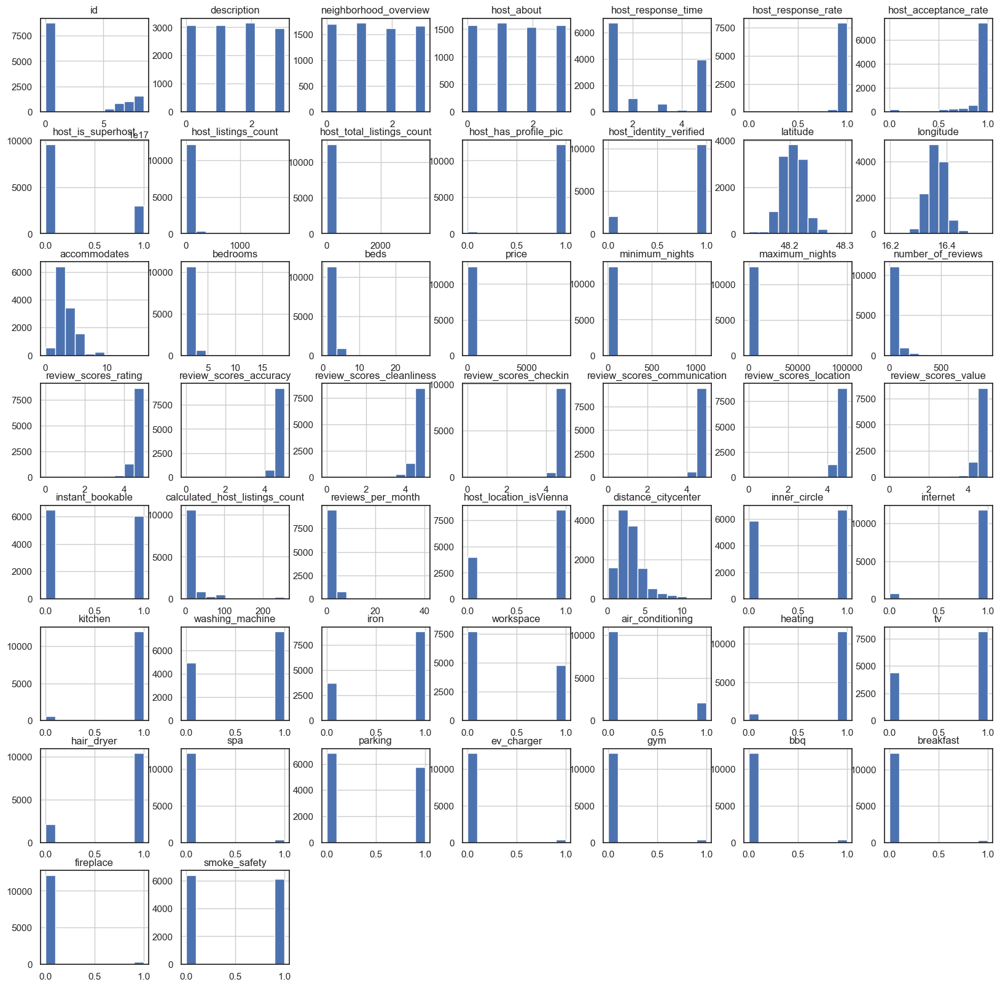

In [44]:
# Plotting the distribution of numerical and boolean categories
listings.hist(figsize=(20,20));

In [45]:
district_df = pd.DataFrame(listings.groupby('neighbourhood_cleansed').size())
district_df.rename(columns={0: 'number_of_listings'}, inplace=True)


In [46]:
# Geographical analysis
import geopandas as gpd #libspatialindex needs to be installed first

# Importing the Vienna districts boundary GeoJSON file as a dataframe in geopandas
map_df = gpd.read_file('./data/neighbourhoods.geojson')
map_df.head()

# Dropping the empty column
map_df.drop('neighbourhood_group', axis=1, inplace=True)

In [47]:
# Creating a dataframe of listing counts and median price by borough
district_df = pd.DataFrame(listings.groupby('neighbourhood_cleansed').size())
district_df.rename(columns={0: 'number_of_listings'}, inplace=True)
district_df['median_price'] = listings.groupby('neighbourhood_cleansed').price.median().values

# Joining the dataframes
district_map_df = map_df.set_index('neighbourhood').join(district_df)

district_map_df.head()

,geometry,number_of_listings,median_price
neighbourhood,,,
Leopoldstadt,"MULTIPOLYGON (((16.38484 48.22616, 16.38495 48...",1457,56.0
Landstra§e,"MULTIPOLYGON (((16.38681 48.21271, 16.38683 48...",1142,63.0
Innere Stadt,"MULTIPOLYGON (((16.36497 48.21590, 16.36498 48...",603,115.0
Brigittenau,"MULTIPOLYGON (((16.38595 48.24764, 16.38611 48...",568,57.0
Floridsdorf,"MULTIPOLYGON (((16.37817 48.28858, 16.37819 48...",165,48.0


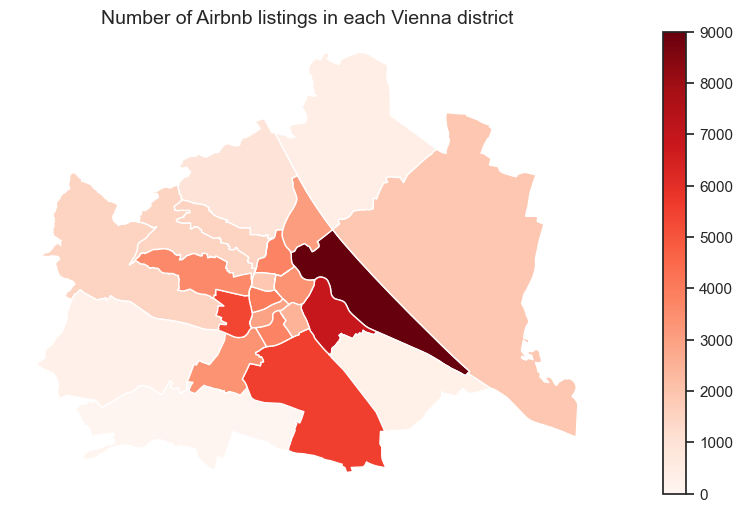

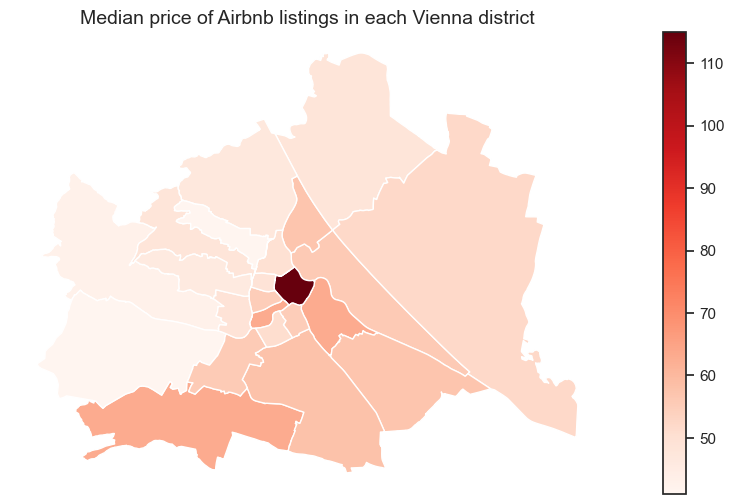

In [48]:
# Plotting the number of listings in each district in Vienna
fig1, ax1 = plt.subplots(1, figsize=(15, 6))
district_map_df.plot(column='number_of_listings', cmap='Reds', ax=ax1)
ax1.axis('off')
ax1.set_title('Number of Airbnb listings in each Vienna district', fontsize=14)
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=0, vmax=9000))
sm._A = [] # Creates an empty array for the data range
cbar = fig1.colorbar(sm)
plt.show()

# Plotting the median price of listings in each district in Vienna
fig2, ax2 = plt.subplots(1, figsize=(15, 6))
district_map_df.plot(column='median_price', cmap='Reds', ax=ax2)
ax2.axis('off')
ax2.set_title('Median price of Airbnb listings in each Vienna district', fontsize=14)
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=min(district_map_df.median_price), vmax=max(district_map_df.median_price)))
sm._A = [] # Creates an empty array for the data range
cbar = fig2.colorbar(sm)
plt.show()

Interestingly, these visualizations show that most Airbnbs in Vienna are located in the 2. district. However, the 1. district has the most expensive Airbnbs.

In [49]:
# Importing libraries needed for further visualizations

import folium
import altair
from folium.features import DivIcon
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster, FeatureGroupSubGroup

from tqdm import tqdm

city_map = folium.Map(location=[48.24262, 16.42767], zoom_start=11.2)
map_df = listings[['neighbourhood_cleansed','latitude','longitude','price']] #.dropna()

In [50]:
# Dropping NAs in order to visualize a heatmap
df_city_map = listings
df_city_map.dropna(inplace=True)

mc = MarkerCluster(control=False)
city_map.add_child(mc)

# Initializing subgroups

g1 = FeatureGroupSubGroup(mc,'Innere Stadt')
city_map.add_child(g1)

g2 = FeatureGroupSubGroup(mc,'Leopoldstadt')
city_map.add_child(g2)

g3 = FeatureGroupSubGroup(mc,'Landstra§e')
city_map.add_child(g3)

g4 = FeatureGroupSubGroup(mc,'Wieden')
city_map.add_child(g4)

g5 = FeatureGroupSubGroup(mc,'Margareten')
city_map.add_child(g5)

g6 = FeatureGroupSubGroup(mc,'Mariahilf')
city_map.add_child(g6)

g7 = FeatureGroupSubGroup(mc,'Neubau')
city_map.add_child(g7)

g8 = FeatureGroupSubGroup(mc,'Josefstadt')
city_map.add_child(g8)

g9 = FeatureGroupSubGroup(mc,'Alsergrund')
city_map.add_child(g9)

g10 = FeatureGroupSubGroup(mc,'Favoriten')
city_map.add_child(g10)

g11 = FeatureGroupSubGroup(mc,'Simmering')
city_map.add_child(g11)

g12 = FeatureGroupSubGroup(mc,'Meidling')
city_map.add_child(g12)

g13 = FeatureGroupSubGroup(mc,'Hietzing')
city_map.add_child(g13)

g14 = FeatureGroupSubGroup(mc,'Penzing')
city_map.add_child(g14)

g15 = FeatureGroupSubGroup(mc,'Rudolfsheim-F\x9fnfhaus')
city_map.add_child(g15)

g16 = FeatureGroupSubGroup(mc,'Ottakring')
city_map.add_child(g16)

g17 = FeatureGroupSubGroup(mc,'Hernals')
city_map.add_child(g17)

g18 = FeatureGroupSubGroup(mc,'W\x8ahring')
city_map.add_child(g18)

g19 = FeatureGroupSubGroup(mc,'D\x9abling')
city_map.add_child(g19)

g20 = FeatureGroupSubGroup(mc,'Brigittenau')
city_map.add_child(g20)

g21 = FeatureGroupSubGroup(mc,'Floridsdorf')
city_map.add_child(g21)

g22 = FeatureGroupSubGroup(mc,'Donaustadt')
city_map.add_child(g22)

g23 = FeatureGroupSubGroup(mc,'Liesing')
city_map.add_child(g23)

# Creating dataframes for the respective subgroups

df1 = df_city_map[df_city_map['neighbourhood_cleansed']=="Innere Stadt"]
df2 = df_city_map[df_city_map['neighbourhood_cleansed']=="Leopoldstadt"]
df3 = df_city_map[df_city_map['neighbourhood_cleansed']=="Landstra§e"]
df4 = df_city_map[df_city_map['neighbourhood_cleansed']=="Wieden"]
df5 = df_city_map[df_city_map['neighbourhood_cleansed']=="Margareten"]
df6 = df_city_map[df_city_map['neighbourhood_cleansed']=="Mariahilf"]
df7 = df_city_map[df_city_map['neighbourhood_cleansed']=="Neubau"]
df8 = df_city_map[df_city_map['neighbourhood_cleansed']=="Josefstadt"]
df9 = df_city_map[df_city_map['neighbourhood_cleansed']=="Alsergrund"]
df10 = df_city_map[df_city_map['neighbourhood_cleansed']=="Favoriten"]
df11 = df_city_map[df_city_map['neighbourhood_cleansed']=="Simmering"]
df12 = df_city_map[df_city_map['neighbourhood_cleansed']=="Meidling"]
df13 = df_city_map[df_city_map['neighbourhood_cleansed']=="Hietzing"]
df14 = df_city_map[df_city_map['neighbourhood_cleansed']=="Penzing"]
df15 = df_city_map[df_city_map['neighbourhood_cleansed']=="Rudolfsheim-F\x9fnfhaus"]
df16 = df_city_map[df_city_map['neighbourhood_cleansed']=="Ottakring"]
df17 = df_city_map[df_city_map['neighbourhood_cleansed']=="Hernals"]
df18 = df_city_map[df_city_map['neighbourhood_cleansed']=="W\x8ahring"]
df19 = df_city_map[df_city_map['neighbourhood_cleansed']=="D\x9abling"]
df20 = df_city_map[df_city_map['neighbourhood_cleansed']=="Brigittenau"]
df21 = df_city_map[df_city_map['neighbourhood_cleansed']=="Floridsdorf"]
df22 = df_city_map[df_city_map['neighbourhood_cleansed']=="Donaustadt"]
df23 = df_city_map[df_city_map['neighbourhood_cleansed']=="Liesing"]


# Listing the filtered dataframe and subgroup objects
df_list = [df1,df2,df3,df4,df5,df6, df7, df8, df9, df10, df11, df12, df13, df14, df15, df16, df17, df18, df19, df20, df21, df22, df23]
grp_list = [g1,g2,g3,g4,g5,g6, g7, g8, g9, g10, g11, g12, g13, g14, g15, g16, g17, g18, g19, g20, g21, g22, g23]

map_df[['latitude','longitude','price']]

for df_idx,map_df in enumerate(df_list):     
    
    if True:
        map_df[['latitude','longitude','price']].dropna(axis=1, inplace=True)
        city_map.add_child(HeatMap(map_df[['latitude','longitude','price']]))
  
    # Adding a marker to the respective group
    for idx,row in tqdm(map_df.iterrows()):
        msg = """
        Neighbourhood Grp: <b>%s</b><br>
        Price: <b>%s</b><br>
        """ %(row['neighbourhood_cleansed'],row['price'])

        Marker([row['latitude'],row['longitude']],tooltip=msg).add_to(grp_list[df_idx])

    
l = folium.LayerControl().add_to(city_map)

city_map

153it [00:00, 9556.93it/s]
0it [00:00, ?it/s]

149it [00:00, 9098.27it/s]
155it [00:00, 7557.48it/s]
78it [00:00, 4875.14it/s]
99it [00:00, 9683.68it/s]
56it [00:00, 9321.42it/s]
133it [00:00, 5291.07it/s]
43it [00:00, ?it/s]
77it [00:00, 4810.84it/s]
99it [00:00, 4123.82it/s]
9it [00:00, 1125.85it/s]
79it [00:00, 3759.23it/s]
15it [00:00, 2495.82it/s]
42it [00:00, 6975.84it/s]
142it [00:00, 510.13it/s]
102it [00:00, 6242.07it/s]
44it [00:00, 5412.80it/s]
36it [00:00, ?it/s]
32it [00:00, 6282.43it/s]
56it [00:00, 6928.85it/s]
9it [00:00, ?it/s]
49it [00:00, ?it/s]
3it [00:00, ?it/s]


This heatmap provides an at-a-glance overview of the spatial distribution of Airbnb listings across Vienna. Each color on the heatmap corresponds to a different intensity level, indicating the concentration of Airbnb accommodations in specific areas of the city. Again, one can see that there are majority of Airbnbs is located very centrally, gradually thinning out the further one moves away from the city center.

#### 4.1 Assessing multicollinearity

Multicollinearity refers to two (or more) predictor variables in a dataset highly correlating with each other. This correlation can cause issues in statistical models as it becomes challenging to recognize individual effects of the separate variables on the outcome variable. 

To analyze multicollinearity, a heatmap of correlations between the features in the dataset is created in the following. This heatmap provides a visual representation of the strength of the correlations, thereby identifying potential multicollinearity. In the next step, the features with a high collinearity are dropped. Then, the correlation heatmap is plotted again without the respective values.

In [51]:
def multi_collinearity_heatmap(df, figsize=(11,9)):

    # Setting the style of the visualization
    sns.set(style="white")

    # Creating a covariance matrix
    corr = df.corr()

    # Generating a mask the size of our covariance matrix
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Setting up the matplotlib figure
    f, ax = plt.subplots(figsize=figsize)

    # Generating a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Drawing the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, vmax=corr[corr != 1.0].max().max());

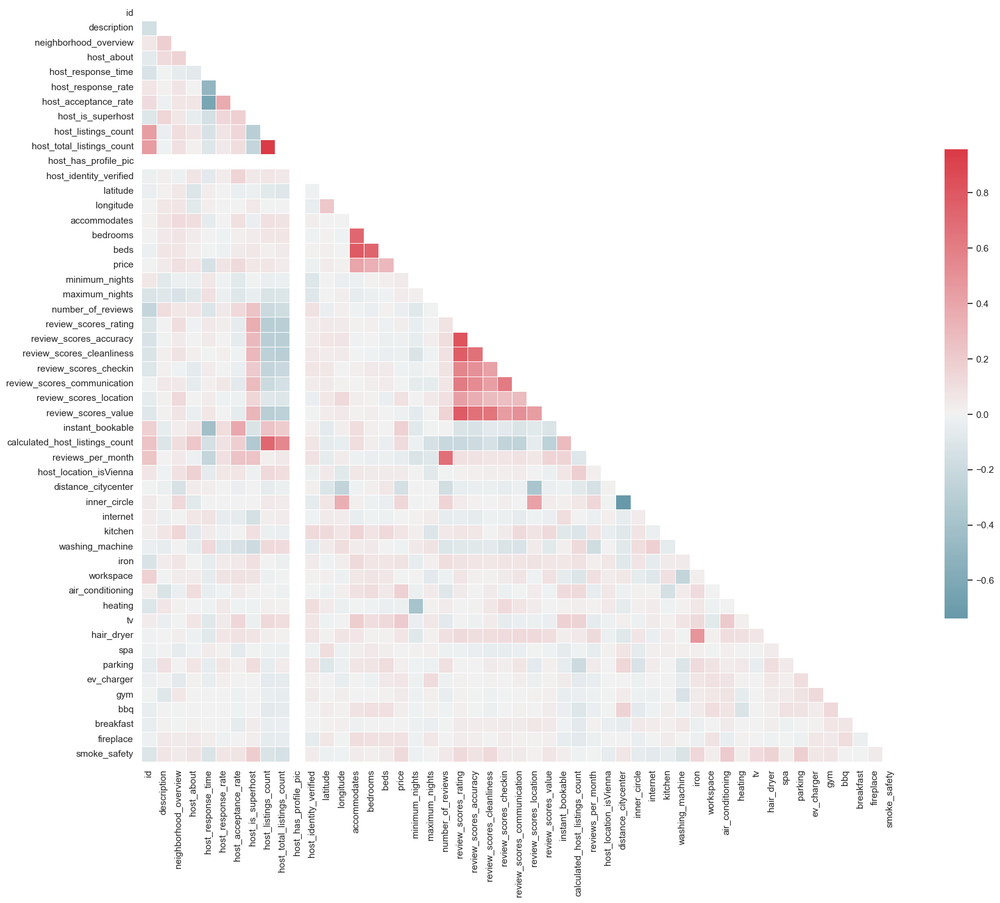

In [52]:
# Setting the figure size to ensure it is clear and easily interpretable for further analysis
multi_collinearity_heatmap(listings, figsize=(20,20))

In [53]:
# Calculating the review mean
listings["review_mean"] = listings[['review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value']].mean(axis=1)

listings.drop(["latitude", "longitude"], axis=1, inplace=True)


# Dropping collinear features
to_drop = ['host_listings_count', 'calculated_host_listings_count', 'beds', 'bedrooms','number_of_reviews','review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value']

listings.drop(to_drop, axis=1, inplace=True)

listings

,id,description,neighborhood_overview,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,...,hair_dryer,spa,parking,ev_charger,gym,bbq,breakfast,fireplace,smoke_safety,review_mean
0,38768,2.0,2.0,2.0,1.0,1.00,1.00,1.0,Leopoldstadt,3.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.788571
1,197968,3.0,0.0,0.0,3.0,1.00,0.97,0.0,Alsergrund,3.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.744286
2,570246,1.0,1.0,0.0,2.0,1.00,1.00,0.0,Mariahilf,32.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.468571
3,203691,3.0,0.0,3.0,2.0,0.92,0.72,0.0,Margareten,74.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.770000
4,203707,3.0,1.0,3.0,2.0,0.92,0.72,0.0,Margareten,74.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.701429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12236,826819341982365280,3.0,3.0,1.0,1.0,1.00,0.99,0.0,Landstraße,572.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5.000000
12244,827300017014306143,2.0,3.0,1.0,1.0,1.00,0.99,0.0,Landstraße,572.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.214286
12256,825031102308698861,0.0,0.0,3.0,1.0,0.99,1.00,1.0,Meidling,29.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.000000
12303,834675848431813547,2.0,3.0,1.0,1.0,1.00,0.99,0.0,Landstraße,572.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5.000000


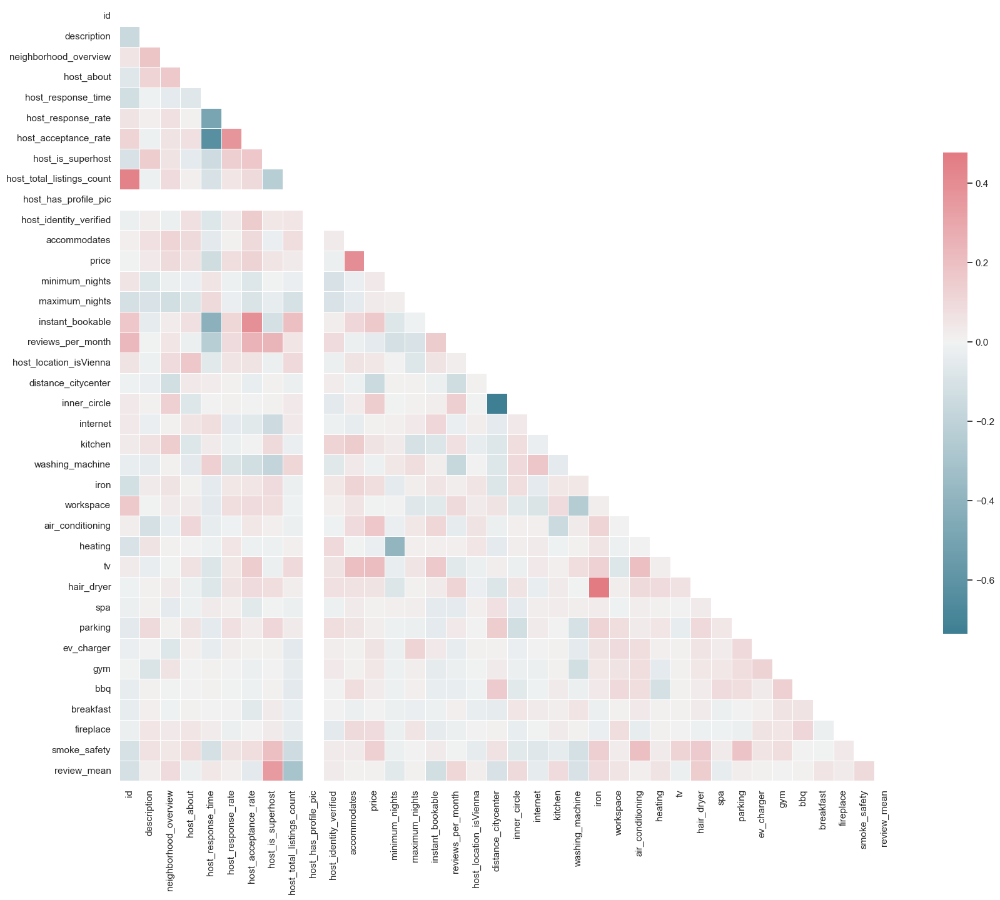

In [54]:
# Drawing the heatmap once again
multi_collinearity_heatmap(listings, figsize=(20,20))

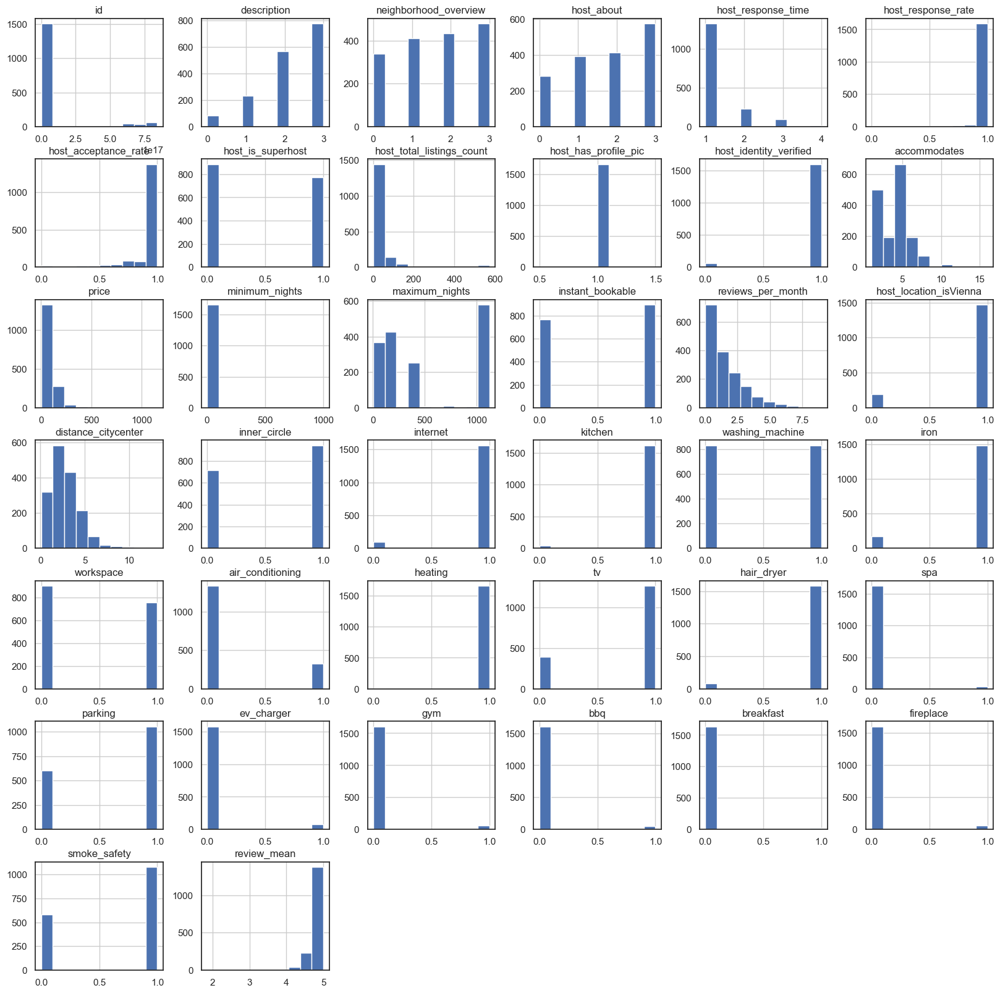

In [55]:
listings.hist(figsize=(20,20));

### 5. Applying ML algorithms (1/2) 

In the following, three machine learning algorithms are applied, namely linear regression, decision trees, and random forests in order to analyze and make predictions based on the Airbnb dataset. The algorithms' outputs are used to apply SHAP globally in Chapter 6.

#### 5.1 Linear regression (1/2)

In [56]:
listings.columns

Index(['id', 'description', 'neighborhood_overview', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_neighbourhood', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'room_type', 'accommodates', 'bathrooms_text',
       'price', 'minimum_nights', 'maximum_nights', 'instant_bookable',
       'reviews_per_month', 'host_location_isVienna', 'distance_citycenter',
       'inner_circle', 'internet', 'kitchen', 'washing_machine', 'iron',
       'workspace', 'air_conditioning', 'heating', 'tv', 'hair_dryer', 'spa',
       'parking', 'ev_charger', 'gym', 'bbq', 'breakfast', 'fireplace',
       'smoke_safety', 'review_mean'],
      dtype='object')

In [57]:
# Chosing columns for linear regression
listings_lr = listings[['neighborhood_overview', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_neighbourhood', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'room_type', 'accommodates', 'bathrooms_text',
       'price', 'minimum_nights', 'maximum_nights', 'instant_bookable',
       'reviews_per_month', 'host_location_isVienna', 'distance_citycenter',
       'inner_circle', 'internet', 'kitchen', 'washing_machine', 'iron',
       'workspace', 'air_conditioning', 'heating', 'tv', 'hair_dryer', 'spa',
       'parking', 'ev_charger', 'gym', 'bbq', 'breakfast', 'fireplace',
       'smoke_safety', 'review_mean']]

listings_lr.dropna(axis=1, inplace=True)

from sklearn.model_selection import train_test_split

#Creating dummies for the category room_type
df_reg_data = pd.get_dummies(listings_lr)
#Split the train/test data using typical 80/20 split
training, test = train_test_split(df_reg_data, test_size=.2, random_state = 15)

X_train = training.loc[:,training.columns != "price"]
y_train = training[["price"]].values.ravel()

X_test = test.loc[:,test.columns != "price"]
y_test = test[["price"]].values.ravel()

In [58]:
from sklearn.linear_model import LinearRegression

# Firstly, model parameters are estimated based on the training data (fitting the model)
linear_reg = LinearRegression().fit(X_train, y_train)

# Secondly, the model predicts the outcome based on the training and test sets
linear_reg_pred_train = linear_reg.predict(X_train) # for the training data
linear_reg_pred = linear_reg.predict(X_test) # for the test data

In [59]:
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score

print("Mean Squared Error on the training set: ", mean_squared_error(y_train, linear_reg_pred_train))
print("R2 Score on the training set: ", r2_score(y_train, linear_reg_pred_train))

print("Mean Squared Error on the test set: ", mean_squared_error(y_test, linear_reg_pred))
print("R2 Score on the test set: ", r2_score(y_test, linear_reg_pred))

Mean Squared Error on the training set:  3603.337188035261
R2 Score on the training set:  0.3397220176480279
Mean Squared Error on the test set:  990382288255259.0
R2 Score on the test set:  -264417701795.5443


#### 5.2 Decision tree (1/2)

In [60]:
from sklearn import tree

clf = tree.DecisionTreeRegressor()
clf = clf.fit(X_train, y_train)

clf_pred_train = clf.predict(X_train) # for the training data
clf_reg_pred = clf.predict(X_test) # for the test data

In [61]:
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score

print("Mean Squared Error on the training set: ", mean_squared_error(y_train, clf_pred_train))
print("R2 Score on the training set: ", r2_score(y_train, clf_pred_train))

print("Mean Squared Error on the test set: ", mean_squared_error(y_test, clf_reg_pred))
print("R2 Score on the test set: ", r2_score(y_test, clf_reg_pred))

Mean Squared Error on the training set:  0.0
R2 Score on the training set:  1.0
Mean Squared Error on the test set:  5968.174698795181
R2 Score on the test set:  -0.5934160540732236


import graphviz 
dot_data = tree.export_graphviz(clf, out_file=None) 
graph = graphviz.Source(dot_data) 
graph.render("decision_tree_global") 

In [62]:
import graphviz 
# Creating the graph
dot_data = tree.export_graphviz(clf, out_file=None, 
                     feature_names=list(X_train.columns),  
                     class_names="price",  
                     filled=True, rounded=True,  
                     special_characters=True)  
graph = graphviz.Source(dot_data)  
graph.format = "svg"
graph.render("decision_tree_global")


(process:18316): GLib-GIO-WARNING **: 23:00:30.068: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.6.2.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs

(process:18316): GLib-GIO-WARNING **: 23:00:30.093: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2304.21.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs


'decision_tree_global.svg'

#### 5.3 Random forest (1/2)

In [63]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV


# Normal random forest without grid search
rforest = RandomForestRegressor(n_estimators=1000, max_depth=5, min_samples_split=2, random_state=0)
rforest.fit(X_train, y_train)

rf_pred_train = rforest.predict(X_train) # for the training data
rf_reg_pred = rforest.predict(X_test) # for the test data



In [64]:
print("Mean Squared Error on the training set: ", mean_squared_error(y_train, rf_pred_train))
print("R2 Score on the training set: ", r2_score(y_train, rf_pred_train))

print("Mean Squared Error on the test set: ", mean_squared_error(y_test, rf_reg_pred))
print("R2 Score on the test set: ", r2_score(y_test, rf_reg_pred))

Mean Squared Error on the training set:  2349.5002113183705
R2 Score on the training set:  0.5694759668298783
Mean Squared Error on the test set:  2716.4806521033915
R2 Score on the test set:  0.27473907851346036


### 6. Applying SHAP globally (1/2)

In this step, SHAP is applied on a global level to gain insights into the relationship between the variable "price" (data type: numeric) and other features in the dataset. By utilizing SHAP globally, the overall influence of the "price" variable is determined and other features that contribute the most to its value are identified. This analysis enhances the understanding of the algorithmic predictions [11].

In [65]:
import shap
shap.initjs()

#### 6.1 SHAP global: Linear regression (1/2)

In [66]:
X_train_summary = shap.kmeans(X_train, 10)

In [67]:
ex = shap.KernelExplainer(linear_reg.predict, X_train_summary)
shap_values = ex.shap_values(X_test.iloc[0,:])
shap_values

array([-2.70116539e+00, -1.08144278e-01,  0.00000000e+00,  6.67329997e-01,
       -4.90479194e-01,  8.13461424e+00, -1.78936422e-02,  0.00000000e+00,
        0.00000000e+00,  9.44472536e-01, -6.63415924e-01,  4.42458205e+00,
        8.98654507e+00, -1.35398677e+01,  0.00000000e+00,  4.18407861e-01,
       -2.45870355e+07,  0.00000000e+00,  0.00000000e+00,  5.12788572e+00,
       -9.64931399e-03,  5.24738640e-01,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  1.13306604e-02,  0.00000000e+00,  9.55769584e-01,
       -1.65946770e-01,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  1.52547852e-01, -1.89145453e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        9.32899619e+06,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  7.22244878e+06,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  

In [68]:
ex = shap.KernelExplainer(linear_reg.predict, X_train_summary)
shap_values = ex.shap_values(X_test.iloc[0,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[0,:])

  0%|          | 0/332 [00:00<?, ?it/s]

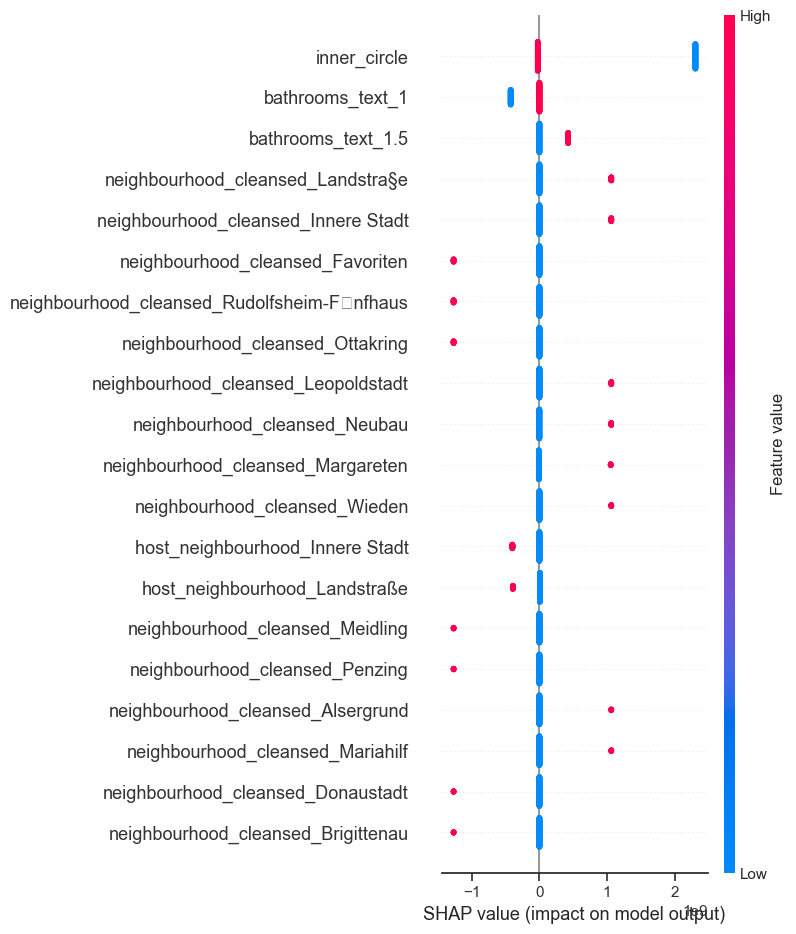

In [69]:
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

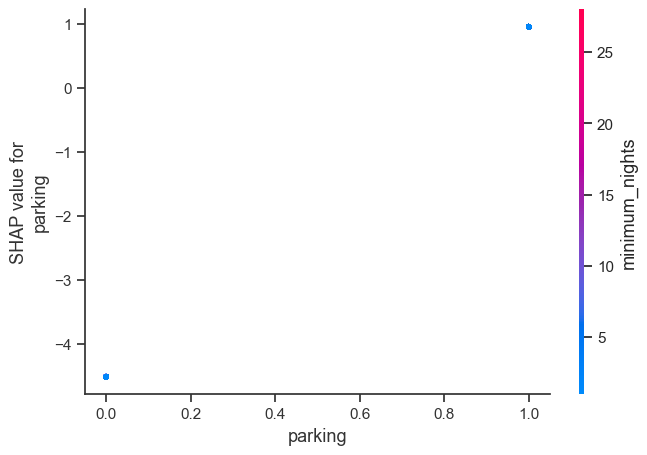

In [70]:
shap.dependence_plot("parking", shap_values, X_test)

In [71]:
listings["price"].describe()

count    1660.000000
mean       82.760843
std        71.573228
min         1.000000
25%        44.000000
50%        73.000000
75%       105.000000
max      1156.000000
Name: price, dtype: float64

In [72]:
shap.force_plot(ex.expected_value, shap_values, X_test)

In the global linear regression algorithm, the most imporant attributes for price prediction seem to be the fact whether the listing is located in Vienna's innercircle and how the host has described the bathroom. However, these predictions do not seem too meaningful.

#### 6.2 SHAP global: Decision tree (1/2)

In [73]:
ex = shap.KernelExplainer(clf.predict, X_train_summary)
shap_values = ex.shap_values(X_test.iloc[0,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[0,:])

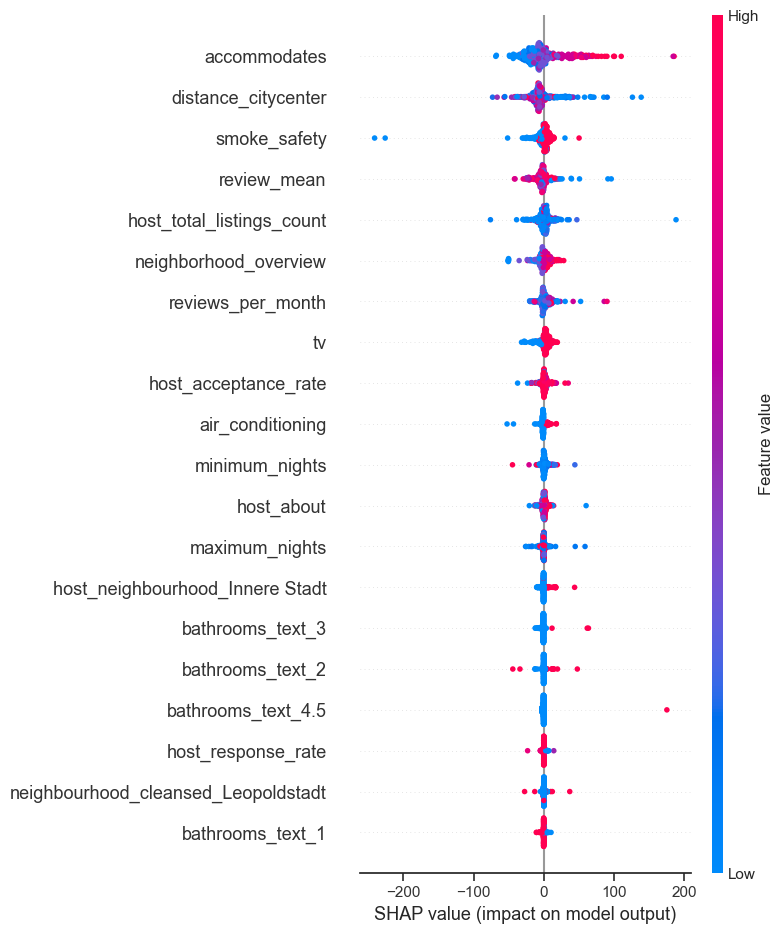

In [74]:
# Explaining all the predictions in the test set
ex = shap.TreeExplainer(clf)
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

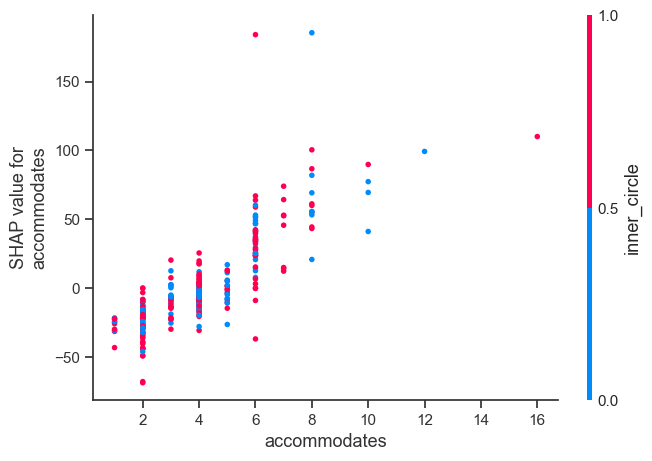

In [75]:
shap.dependence_plot("accommodates", shap_values, X_test)

In [76]:
shap.force_plot(ex.expected_value, shap_values, X_test)

The decision tree algorithm shows that globally, the amount of how many people can be accomodated in a certain listing seems to have the highest influence on the price. This is quite logical as the more people fit into an accomodation, the higher the price for that particular accomodation. Other important attributes driving the price are the distance to the city center, the amount of other listings the host has (potentially indicating his/her trustworthiness) and the average review. 

#### 6.3 SHAP global: Random forest (1/2)

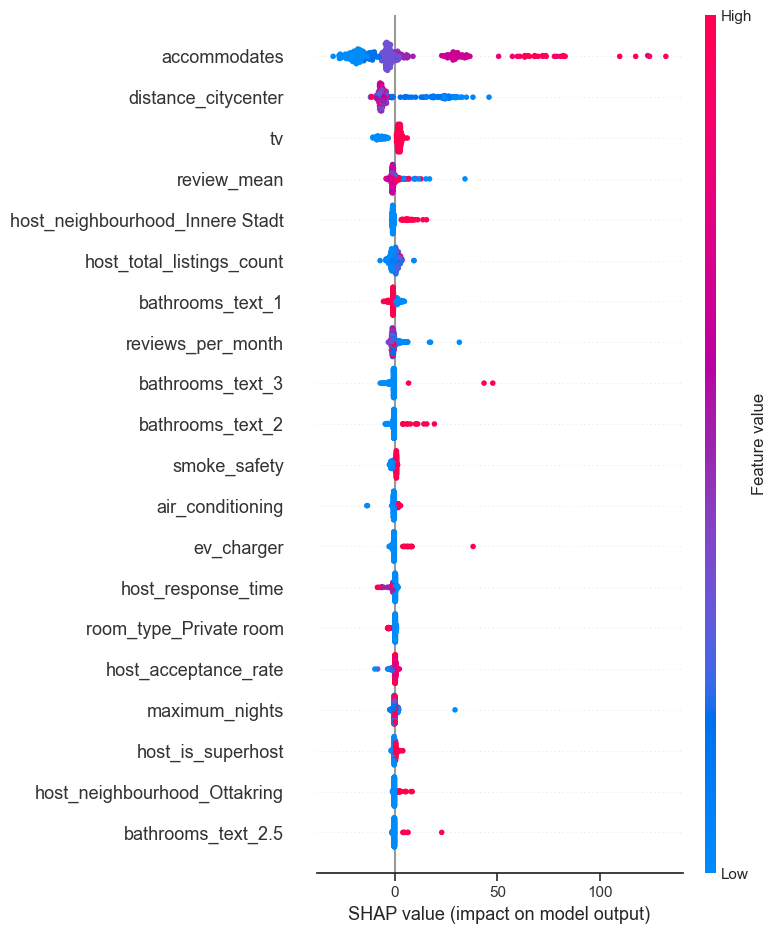

In [77]:
# SHAP does not yet work for Grid search. Therefore, a normal RF regression is used.

# Explaining all predictions in the test set
explainer = shap.TreeExplainer(rforest)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

The results of the random forest algorithm are similar to the ones of the decision tree algorithm: The main price drivers globally are inter alia the number of people that can be accomodated, the distance to the citycenter and the average review. Interestingly, another price driver here is whether the listing has a TV.

### 7.Applying ML algorithms (2/2) 


In this chapter, the three machine learning algorithms are applied again. This time, the algorithms' outputs are used to apply SHAP locally, more specifically on the 19. District, in Chapter 8.

#### 7.1 Linear regression (2/2)

In [78]:
listings_lr = listings[['neighborhood_overview', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_neighbourhood', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'room_type', 'accommodates', 'bathrooms_text',
       'price', 'minimum_nights', 'maximum_nights', 'instant_bookable',
       'reviews_per_month', 'host_location_isVienna', 'distance_citycenter',
       'inner_circle', 'internet', 'kitchen', 'washing_machine', 'iron',
       'workspace', 'air_conditioning', 'heating', 'tv', 'hair_dryer', 'spa',
       'parking', 'ev_charger', 'gym', 'bbq', 'breakfast', 'fireplace',
       'smoke_safety', 'review_mean']]

In [79]:
#Linear regression
listings_lr = listings_lr[listings_lr["neighbourhood_cleansed"] == "D\x9abling"]

listings_lr.dropna(axis=1, inplace=True)

#Create the dummies for the category room_type
df_reg_data = pd.get_dummies(listings_lr)
#Split the train/test data using typical 80/20 split
training, test = train_test_split(df_reg_data, test_size=.2, random_state = 15)

X_train = training.loc[:,training.columns != "price"]
y_train = training[["price"]].values.ravel()

X_test = test.loc[:,test.columns != "price"]
y_test = test[["price"]].values.ravel()

# first, we estimate the model parameters on the training data (fitting the model)
linear_reg = LinearRegression().fit(X_train, y_train)

# then, we can let the model predict the outcome on the training and test sets
linear_reg_pred_train = linear_reg.predict(X_train) # for the training data
linear_reg_pred = linear_reg.predict(X_test) # for the test data

print("Mean Squared Error on the training set: ", mean_squared_error(y_train, linear_reg_pred_train))
print("R2 Score on the training set: ", r2_score(y_train, linear_reg_pred_train))

print("Mean Squared Error on the test set: ", mean_squared_error(y_test, linear_reg_pred))
print("R2 Score on the test set: ", r2_score(y_test, linear_reg_pred))

Mean Squared Error on the training set:  7.982623783381738e-22
R2 Score on the training set:  1.0
Mean Squared Error on the test set:  31237.817408071216
R2 Score on the test set:  -7.393486872240322


#### 7.2 Decision tree (2/2)

In [80]:
clf = tree.DecisionTreeRegressor()
clf = clf.fit(X_train, y_train)

clf_pred_train = clf.predict(X_train) # for the training data
clf_reg_pred = clf.predict(X_test) # for the test data

from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score

print("Mean Squared Error on the training set: ", mean_squared_error(y_train, clf_pred_train))
print("R2 Score on the training set: ", r2_score(y_train, clf_pred_train))

print("Mean Squared Error on the test set: ", mean_squared_error(y_test, clf_reg_pred))
print("R2 Score on the test set: ", r2_score(y_test, clf_reg_pred))

Mean Squared Error on the training set:  0.0
R2 Score on the training set:  1.0
Mean Squared Error on the test set:  8523.142857142857
R2 Score on the test set:  -1.2901371996358892


#### 7.2 Random forest (2/2)

In [81]:
#Normal random forest without Grid search
rforest = RandomForestRegressor(n_estimators=1000, max_depth=5, min_samples_split=2, random_state=0)
rforest.fit(X_train, y_train)

rf_pred_train = rforest.predict(X_train) # for the training data
rf_reg_pred = rforest.predict(X_test) # for the test data

print("Mean Squared Error on the training set: ", mean_squared_error(y_train, rf_pred_train))
print("R2 Score on the training set: ", r2_score(y_train, rf_pred_train))

print("Mean Squared Error on the test set: ", mean_squared_error(y_test, rf_reg_pred))
print("R2 Score on the test set: ", r2_score(y_test, rf_reg_pred))


Mean Squared Error on the training set:  203.76140489966127
R2 Score on the training set:  0.8646102182569355
Mean Squared Error on the test set:  10554.46771249645
R2 Score on the test set:  -1.8359467318428515


### 8. Applying SHAP locally (19. District) 

In this step, SHAP is applied again - this time on a local level in order to analyze the 19th district in detail, while still focusing on the "price" varible (numerical). 

By leveraging SHAP on a local level, one can gain a more granular understanding of how the "price" influences the features within the 19th district. Potentially, this analysis allows to uncover specific patterns that are unique to this particular district, shedding light on which factors drive pricing dynamics within Viennas 19th district [11].

#### 8.1 SHAP local: Linear Regression

In [82]:
X_train_summary = shap.kmeans(X_train, 10)

ex = shap.KernelExplainer(linear_reg.predict, X_train_summary)
shap_values = ex.shap_values(X_test.iloc[0,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[0,:])

  0%|          | 0/7 [00:00<?, ?it/s]

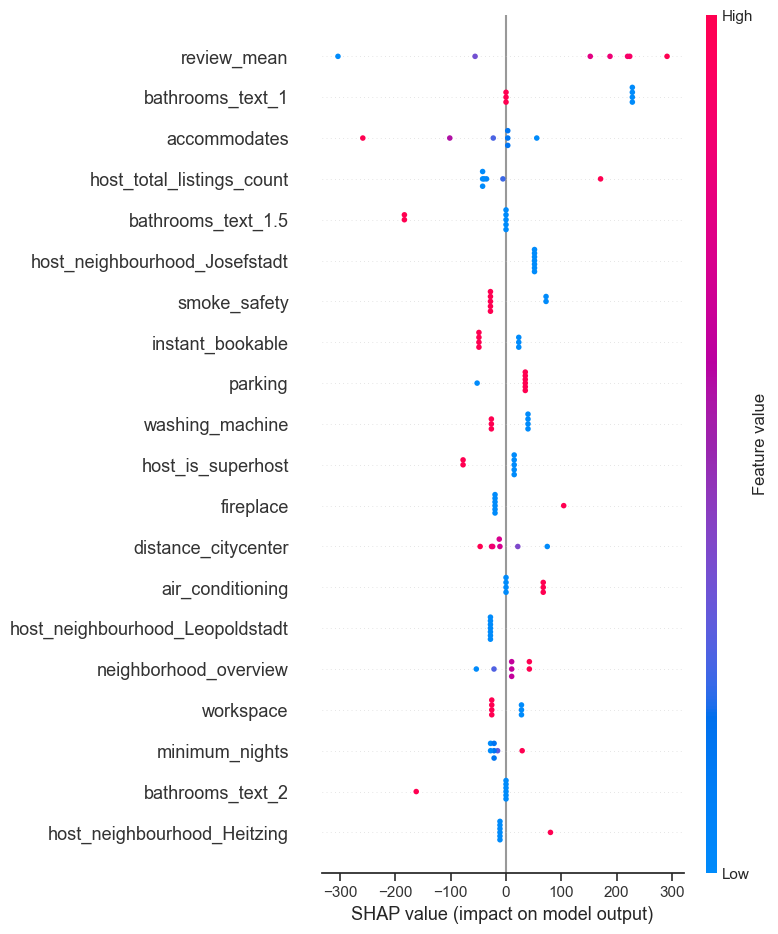

In [83]:
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

In [84]:
shap.force_plot(ex.expected_value, shap_values, X_test)

Similar to the global application of SHAP with a linear regression algorithm, the outcomes of the local application were also found to be little meaningful. Furthermore, they are different to the results from the other two algorithms, which is why we chose to neglect them for the purpose of this research project.

#### 8.2 SHAP local: Decision tree

In [85]:
ex = shap.KernelExplainer(clf.predict, X_train_summary)
shap_values = ex.shap_values(X_test.iloc[0,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[0,:])

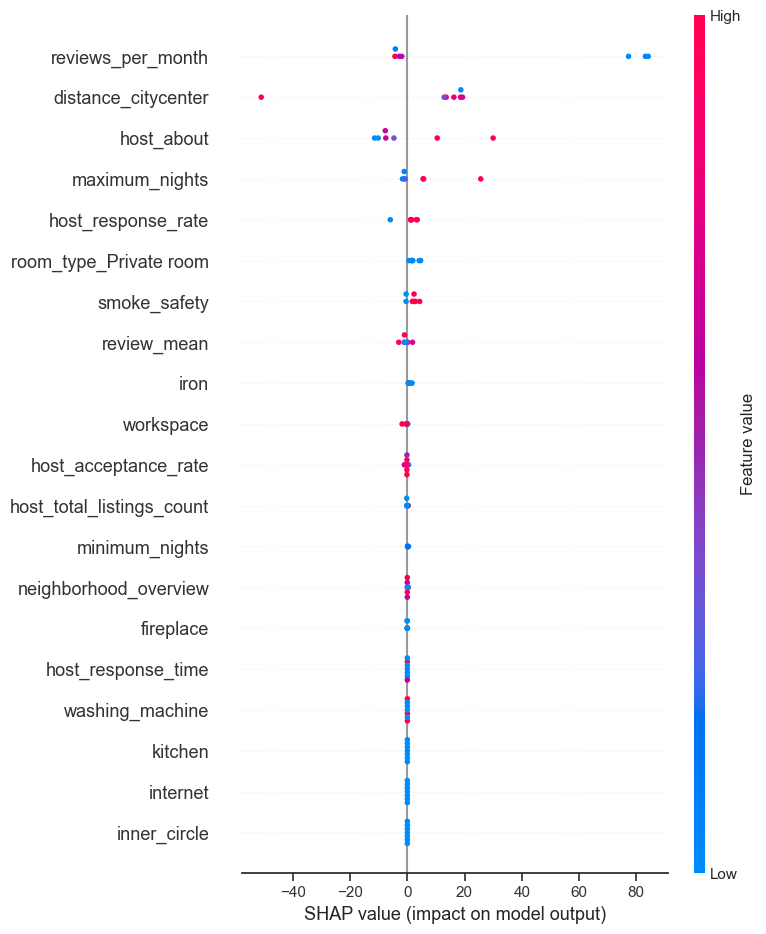

In [86]:
# explain all the predictions in the test set
ex = shap.TreeExplainer(clf)
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

In [87]:
shap.force_plot(ex.expected_value, shap_values, X_test)

According to this algorithm, the prices for Airbnb listings in the 19th district are driven by their distance to the citycenter, which is similar to the global results. However, other price drivers here are the response time of the host, how much the host writes about him/herself (potentially indicating trustworthiness) and how many nights can be booked. The latter could potentially indicate that people looking for an Airbnb accomodation are often interested in longer rentals. 

#### 8.3 SHAP local: Random forest

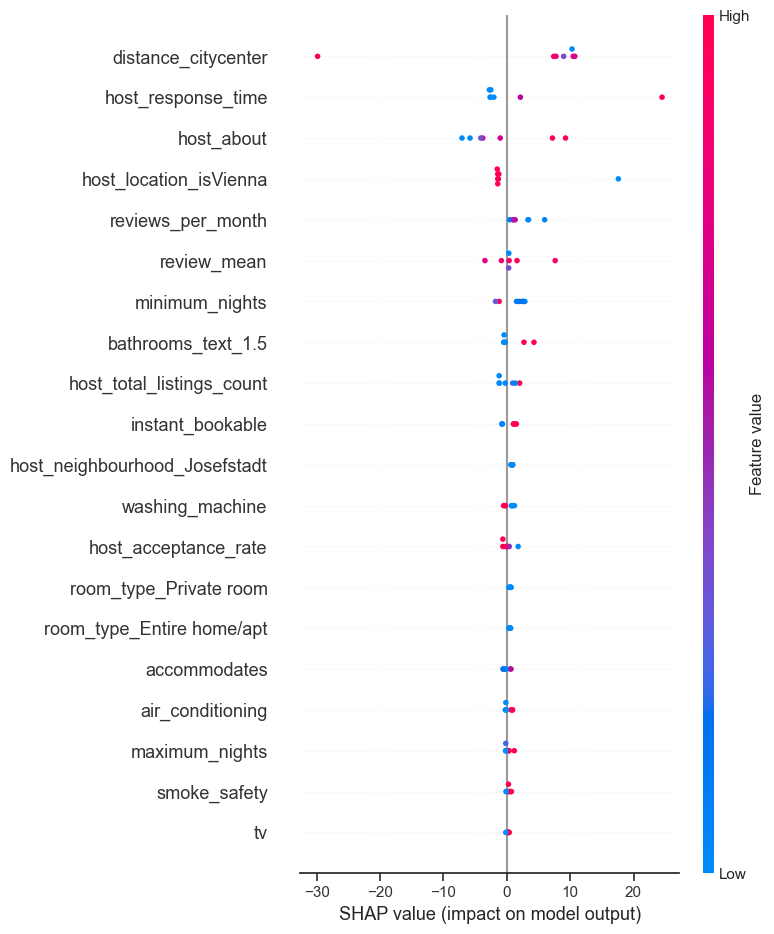

In [88]:
# SHAP does not yet work for Grid search. Therefore, a normal RF regression is used.

# Explaining all predictions in the test set
explainer = shap.TreeExplainer(rforest)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

Confirming the results of the previous algorithm, also the random forest algorithm predicts the distance to the citycenter, the host's response time and the personal information of the host to be the main price drivers of Airbnb listings in the 19th district. Surprisingly, this algorithm also predicts the fact whether the host is located in Vienna to also have an influence on the price. Potentially, people perceive the host to be more approachable if he/she is located in the same city.

### 9. Categorising the "price" variable

In this chapter, a different approach for price prediction is used. This time, the "price" variable is transformed from a numerical value into a categorical value. To achieve this, the price is categorized into intervals based on quartiles.

By categorizing the price into intervals, one can gain insights into how different price ranges impact the model's predictions and feature importance. 

In [89]:
# Transforming the numerical price into (categorical) price intervals
bins = [1, 18, 103, 195, 2687]

labels = ["1", "2", "3", "4"]
listings["price"] = pd.cut(x = listings["price"], bins=bins, labels = labels, include_lowest = True)

listings.price.value_counts()

2    965
3    333
1    274
4     88
Name: price, dtype: int64

In [90]:
listings_lr = listings[['neighborhood_overview', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_neighbourhood', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'room_type', 'accommodates', 'bathrooms_text',
       'price', 'minimum_nights', 'maximum_nights', 'instant_bookable',
       'reviews_per_month', 'host_location_isVienna', 'distance_citycenter',
       'inner_circle', 'internet', 'kitchen', 'washing_machine', 'iron',
       'workspace', 'air_conditioning', 'heating', 'tv', 'hair_dryer', 'spa',
       'parking', 'ev_charger', 'gym', 'bbq', 'breakfast', 'fireplace',
       'smoke_safety', 'review_mean']]

listings_lr.dropna(inplace=True)

# Creating the dummies for the category room_type
df_reg_data = pd.get_dummies(listings_lr.loc[:,listings_lr.columns != "price"])
df_reg_data["price"] = listings_lr["price"]
#Split the train/test data using typical 80/20 split
training, test = train_test_split(df_reg_data, test_size=.2, random_state = 15)

X_train = training.loc[:,training.columns != "price"]
y_train = training[["price"]].values.ravel()

X_test = test.loc[:,test.columns != "price"]
y_test = test[["price"]].values.ravel()

# Firstly, the model parameters on the training data are estimated (fitting the model)
linear_reg = LinearRegression().fit(X_train, y_train)

# Afterwards, the model predicts the outcome on the training and test sets
linear_reg_pred_train = linear_reg.predict(X_train) # for the training data
linear_reg_pred = linear_reg.predict(X_test) # for the test data

# Decision tree
clf = tree.DecisionTreeRegressor()
clf = clf.fit(X_train, y_train)

clf_pred_train = clf.predict(X_train) # for the training data
clf_reg_pred = clf.predict(X_test) # for the test data


# Normal random forest without Grid search
rforest = RandomForestRegressor(n_estimators=1000, max_depth=5, min_samples_split=2, random_state=0)
rforest.fit(X_train, y_train)

rf_pred_train = rforest.predict(X_train) # for the training data
rf_reg_pred = rforest.predict(X_test) # for the test data

Through our price categorization of Airbnb listings, we observed a notable concentration of listings in the second quartile. The first and third quartiles display comparable outcomes, suggesting a relatively similar distribution. Remarkably, the fourth quartile thereby the highest-priced listings are also the fewest.

### 10. Applying SHAP globally (after categorizing the "price" variable)

Applying SHAP globally with the categorical price variable allows to examine the impact of different price intervals on the interpretability of the model [11], i.e. examinig which price range(s) have the highest influence on the predictions.

#### 10.1 Using price intervals and applying SHAP: Linear Regression

In [91]:
X_train_summary = shap.kmeans(X_train, 10)

In [92]:
ex = shap.KernelExplainer(linear_reg.predict, X_train_summary)
shap_values = ex.shap_values(X_test.iloc[0,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[0,:])

  0%|          | 0/332 [00:00<?, ?it/s]

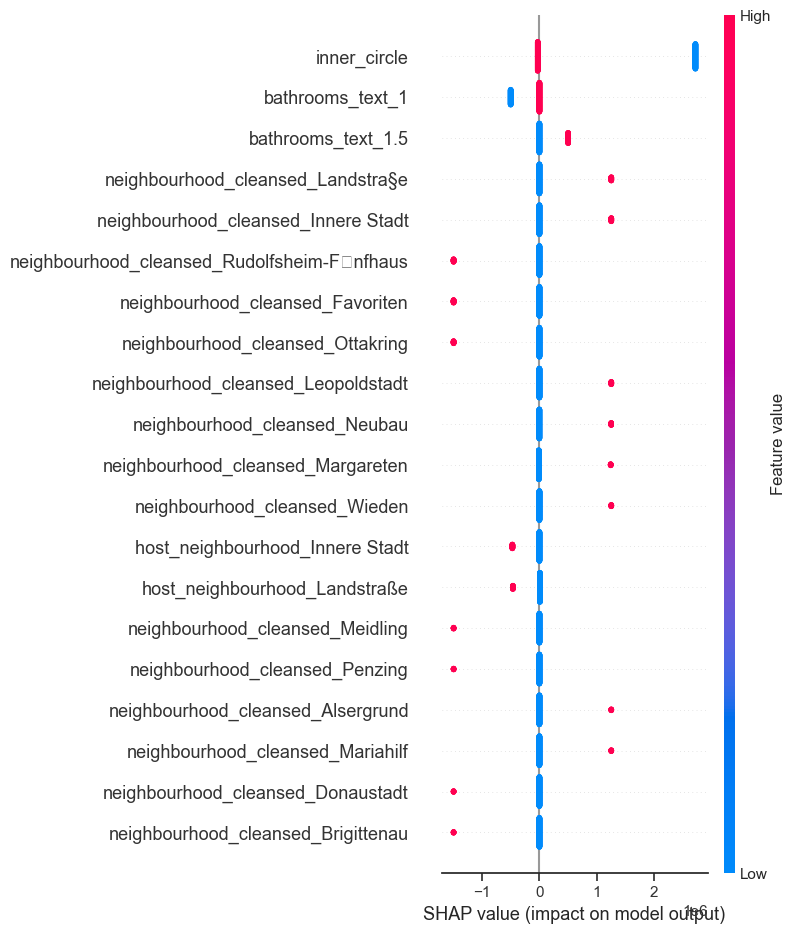

In [93]:
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

In [94]:
shap.force_plot(ex.expected_value, shap_values, X_test)

Overall, this research projects shows that the linear regression algorithm does not produce meaningful results in the context of predicting Airbnb prices in Vienna. Therefore, we again chose to neglect the outcomes of this algorithm. Nevertheless, it is noteworthy that regardless of whether the prices are categorized or not, the predictions remain consistent

#### 10.2 Using price intervals and applying SHAP: Decision tree

In [95]:
ex = shap.KernelExplainer(clf.predict, X_train_summary)
shap_values = ex.shap_values(X_test.iloc[0,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[0,:])

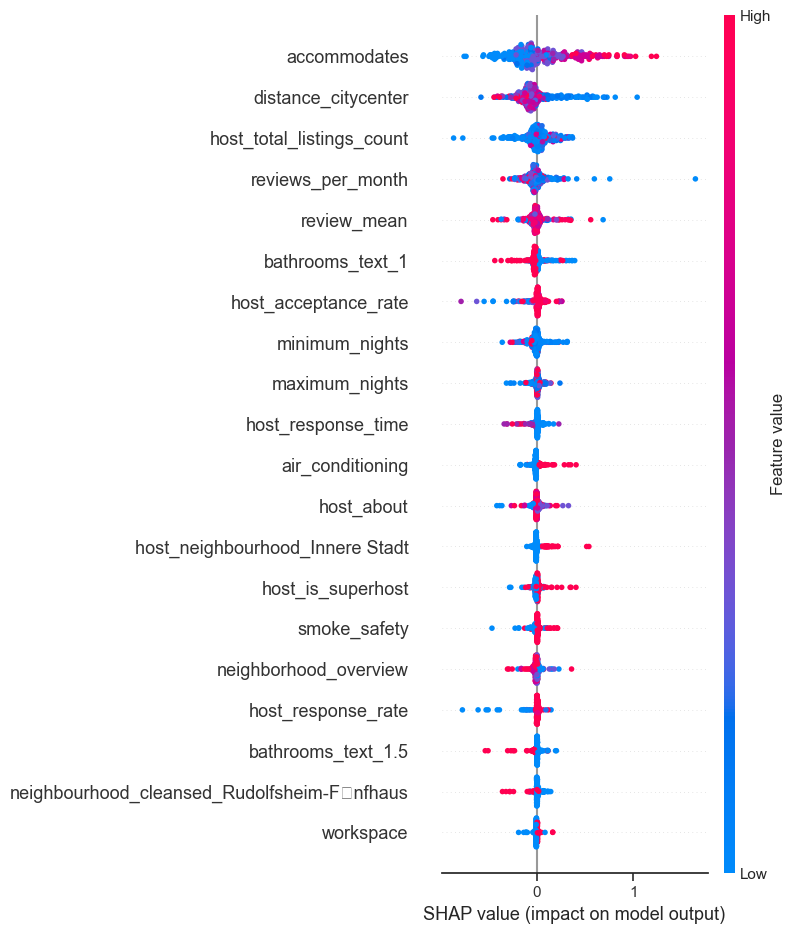

In [96]:
# Explaining all the predictions in the test set
ex = shap.TreeExplainer(clf)
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

In [97]:
shap.force_plot(ex.expected_value, shap_values, X_test)

When comparing the outcomes to those obtained from the decision tree algorithm without price categorization, the predictions in this case remain nearly identical: "accomodates", "distance_citycenter", "host_total_listings_count" are the three most important price drivers for Airbnb listings in Vienna.

Overall, this suggests that whether the price is categorized or not does not significantly influence the accuracy/the outcomes of the prediction models.

#### 10.3 Using price intervals and applying SHAP: Random forest

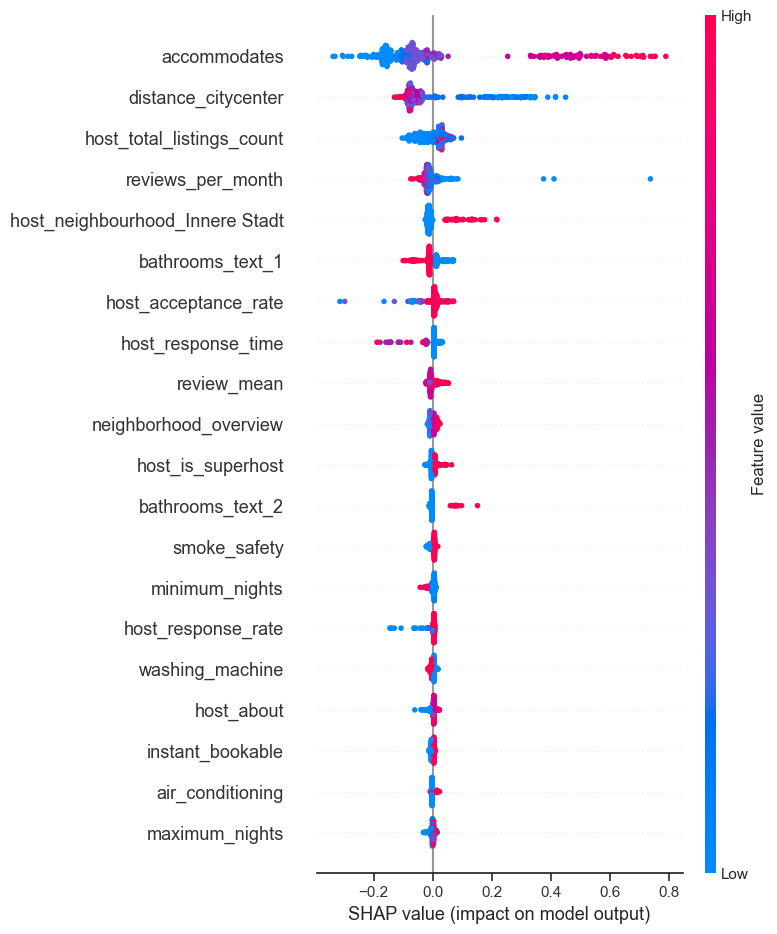

In [98]:
# Explaining the predictions in the test set
explainer = shap.TreeExplainer(rforest)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

In [99]:
shap.force_plot(explainer.expected_value, shap_values, X_test)

In comparison to the decision tree algorithm, the inclusion of price categorization has a subtle impact on the random forest algorithm. Although the effect is relatively minor, certain differences can be perceived. While "accommodates" and "distance_citycenter" consistently emerge as the top two price drivers, the third influential factor differs for the two scenarios, with "tv" being significant in one case and "host_total_listings_count" in the other.

In general, the price categorization had minimal impact on the algorithms' predictions, emphasizing the robustness of the models. 

Overall, one can conclude that the research project yields good results as the global predictions from both the decision tree and random forest algorithms demonstrate a high degree of consistency. This highlights the reliability and effectiveness of the models employed.

### 11. Qualitative Analysis

In this chapter, we will briefly touch upon our findings from the qualitative analysis of our research. It is important to mention that our research is mainly focussed on the quantitative and implementation aspects. However, we also investigated a sub-question of our main research question above:

"How interpretable is SHAPs output in the context of predicting Airbnb rental pricing?" 

In order to address this question, we conducted two brief and unstructured interviews — one with an individual who is well-versed in AI, and another interview with a non-technical person. These interviews provided valuable insights which we have summarized below. The interviewees were male and female and both are currently in the process of pursuing a degree at WU. (Side note: For more information on the interviews, interviewees, or interview transcriptions, feel free to contact us.) 

First, both interviewees were provided some information of the conducted research and on Airbnb in general. Then, they were shown the SHAP summary plot of the global decision tree algorithm (see chapter 6.2). Subsequently, they were asked whether they can derive certain insights or conclusions from the plot. 

Interestingly, despite their contrasting levels of familiarity with AI, both interviewees demonstrated similar understandings of the SHAP summary plot. Both demonstrated a clear understanding of the most important features that influence the price predictions. According to the interviewees, the plot is structured in an effective way, ranking the features by descending importance, which facilitated their comprehension. 

However, when exploring the rest of the plot, both interviewees expressed confusion regarding certain elements, which they found less intuitive. For instance, both interviewees struggled to understand the exact meaning of the feature value bar on the right. Additionally, they encountered difficulty in comprehending why the distribution of the entries for each feature did not only spread from left to right, but also a little from top to bottom. Overall, one can conclude that without additional information provided, a person not familiar with xAI cannot unambiguously interpret the SHAP plots. 

The interviewees' feedback emphasized the importance of enhancing the visualizations' overall comprehensibility. This could potentially include providing clearer and more precide explanations of the scale or units represented. Also, a more intuitive connection could be established between, in this case, the feature values and their impact on the predicted Airbnb rental prices.

During our class presentation, we aimed at conducting a small live-interview in which we asked a participant to explain what can be seen in the SHAP summary plot. However, also there, no very clear answer could be retrieved. This confirms the overall finding that interpreting a SHAP plot without additional information text is rather difficult and not neccessarily practical.

### 12. Summary 

While the project's results obtained from linear regression can be disregarded, the consistency of outcomes from the decision tree and random forest algorithms throughout the project is a positive finding. 
Although the qualitative part of our research revealed that the SHAP summary plots would benefit from improved descriptions and explanatory text, the overall results of the project are encouraging.
So, while there is room for improvement in the visualization of the plots, incorporating more comprehensive descriptions and explanatory text, the project's overall success underscores its significance. 
Summarized, prices for Airbnbs in Vienna are determined by the number of people that can be accomodated, its location (measured by the distance to the city center), the reviews and certain characteristics of the host.

### 13. Sources

[1] - Investor Relations | Airbnb | Airbnb Announces First Quarter 2023 Results (2023).

[2] – Ikkåala & Lampinen (2014). Defining the price of hospitality: networked hospitality exchange via Airbnb

[3] – Li et al. (2016). Reasonable price recommendation on Airbnb using Multi-Scale clustering

[4] – Gutt & Herrmann (2015). Sharing Means Caring? Hosts’ Price Reaction to Rating Visibility.

[5] – Zhang et al. (2017). Key factors affecting the price of Airbnb listings: A geographically weighted
approach

[6] – Casamatta et al. (2022). Host type and pricing on Airbnb: Seasonality and perceived market power

[7] – Das, A., & Rad, P. (2020). Opportunities and challenges in explainable artificial intelligence (xai): A survey. arXiv preprint arXiv:2006.11371.

[8] - Ghosh, I., Jana, R. K., & Abedin, M. Z. (2023). An ensemble machine learning framework for Airbnb rental price modeling without using amenity-driven features. International Journal of Contemporary Hospitality Management.

[9] - Sharma, R., Kumar, A., & Chuah, C. (2021). Turning the blackbox into a glassbox: An explainable machine learning approach for understanding hospitality customer.

[10] – Carillo, G. (2019). Exploration of Edinburgh's short rental market. https://github.com/gracecarrillo/Predicting-Airbnb-prices-with-machine-learning-and-location-data/blob/gh- pages/Exploring_Edinburgh_Graciela_Carrillo.ipynb


[11] - Lundberg, S. (2018). An introduction to explainable AI with Shapley values.
https://shap.readthedocs.io/en/latest/example_notebooks/overviews/An%20introduction%20to%20explainable%20AI%20with%20Shapley%20values.html